In [2]:
import numpy as np
import pandas as pd
# For visualizations
import matplotlib.pyplot as plt
# For regular expressions
import re
# For handling string
import string
# For performing mathematical operations
import math

# Importing dataset
df=pd.read_csv('Codeacademy20210102131605.csv')
df.head(10)

,Unnamed: 0,Topic Title,Category,Tags,Leading Comment,Other Comments,Likes,Views
0,0,[How to] Format code in posts,Getting Started,[],Codecademy Discuss posts are parsed with Markd...,[],21,13.8k
1,1,Guide: A list of how-to’s for giving and recei...,Getting Started,[],Technical guides will teach you how to use the...,[],0,0
2,2,Guide: Learn about our community forums,Getting Started,[],Take a moment and read through each of these b...,[],0,0
3,3,[How-to] Create a topic that everyone will read,Getting Started,[],A great topic is one that provides potential h...,[],0,0
4,4,[Learn More] How the forum is organized,Getting Started,[],"With Codecademy Community forums, conversation...",[],0,0
5,5,[Learn more] Welcome to the Codecademy Communi...,Getting Started,[],"Hi there,\nWe’re delighted to have you join us...",[],0,0
6,6,How to ask good questions (and get good answers),Getting Started,[],"In general, your post will get a good answer i...",[],47,11.8k
7,7,Welcome to our forums! Please Introduce Yourself,Getting Started,[],Hello!\nThere are so many learners on this for...,['Hello!\nThere are so many learners on this f...,26.4k,141k
8,8,[Learn more] Being a good user of the forums,Getting Started,[],"We’re all here to keep evolving by learning, t...",[],0,0
9,9,Meet our team of Superusers!,Getting Started,[],"Hi learners,\nHave you met our team of Superus...","['Hi learners,\nHave you met our team of Super...",151,555


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1736 entries, 0 to 1735
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Unnamed: 0       1736 non-null   int64 
 1   Topic Title      1736 non-null   object
 2   Category         1736 non-null   object
 3   Tags             1736 non-null   object
 4   Leading Comment  1736 non-null   object
 5   Other Comments   1736 non-null   object
 6   Likes            1736 non-null   object
 7   Views            1736 non-null   object
dtypes: int64(1), object(7)
memory usage: 108.6+ KB


In [5]:
#to see any null value present in our dataset
df.isnull().sum()

Unnamed: 0         0
Topic Title        0
Category           0
Tags               0
Leading Comment    0
Other Comments     0
Likes              0
Views              0
dtype: int64


**So Dataset has no null values**


Text(0, 0.5, 'no of posts')

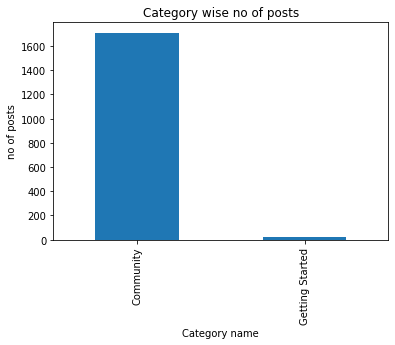

In [4]:
df['Category'].value_counts().plot.bar()
# Add title and axis names
plt.title('Category wise no of posts')
plt.xlabel('Category name')
plt.ylabel('no of posts')


**So Community has most no of posts**


Text(0, 0.5, 'no of posts')

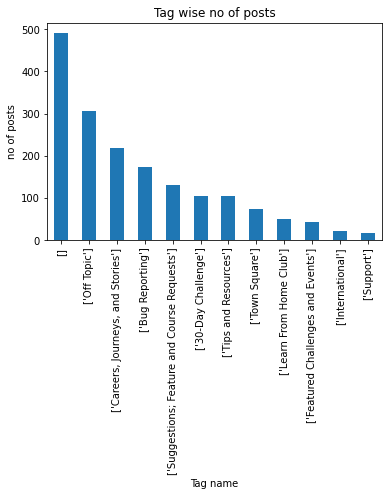

In [7]:
df['Tags'].value_counts().plot.bar()
# Add title and axis names
plt.title('Tag wise no of posts')
plt.xlabel('Tag name')
plt.ylabel('no of posts')


**Most of the posts do not have any tags. We can see a large no of posts of "Off topic" tag.**


In [10]:
df['word_count'] = df['Leading Comment'].apply(lambda x: len(str(x).split(" "))) ##to calculate word count 
df['char_count'] = df['Leading Comment'].str.len() ## this also includes spaces

#for stop words
from nltk.corpus import stopwords
stop = stopwords.words('english')

df['stopwords'] = df['Leading Comment'].apply(lambda x: len([x for x in x.split() if x in stop]))
df[['Leading Comment','word_count','char_count','stopwords']].head()

,Leading Comment,word_count,char_count,stopwords
0,Codecademy Discuss posts are parsed with Markd...,317,1755,66
1,Technical guides will teach you how to use the...,81,484,29
2,Take a moment and read through each of these b...,74,491,24
3,A great topic is one that provides potential h...,188,1130,67
4,"With Codecademy Community forums, conversation...",122,774,44


In [11]:
Compare=df.loc[:,['word_count','stopwords']]
Compare.describe()

,word_count,stopwords
count,1736.000000,1736.000000
mean,139.954493,51.766705
std,249.080783,87.221043
min,1.000000,0.000000
25%,37.000000,14.000000
50%,68.000000,25.000000
75%,138.500000,52.250000
max,4819.000000,1023.000000


In [12]:
#Lowercase the reviews
df['cleaned']=df['Leading Comment'].apply(lambda x: x.lower())
#Remove digits and words containing digits
df['cleaned']=df['cleaned'].apply(lambda x: re.sub('\w*\d\w*','', x))
#Remove Punctuations
df['cleaned']=df['cleaned'].apply(lambda x: re.sub('[%s]' % re.escape(string.punctuation), '', x))
# Removing extra spaces
df['cleaned']=df['cleaned'].apply(lambda x: re.sub(' +',' ',x))
# Removing stop words
df['cleaned'] = df['cleaned'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))


for index,text in enumerate(df['cleaned'][0:]):
    print('\n\n Leading Comment of Post %d:\n '%(index+1),text)



 Leading Comment of Post 1:
  codecademy discuss posts parsed markdown markdown allows easy formatting code text strips html posts default prevent security risks show format code shows summary format code it’s visible either wrap single backticks small amount code triple backticks otherwise blank line large amount code details inline code indicate small span code wrap backticks example use consolelog function would produce use consolelog function code blocks toolbar icon using preformatted text icon toolbar screenshot× kb automatically create code block paste code select code press icon manually indicate code block either wrap entire block three backticks doctype html html head metadata external resources head body page content body html indent code four spaces doctype html html head metadata external resources head body page content body html first produces doctype html html head metadata external resources head body page content body html second produces doctype html html head meta

In [19]:
## 5 Common word removal
freq = pd.Series(' '.join(df['cleaned']).split()).value_counts()[:5]
freq

make     495
help     487
work     462
don’t    461
use      458
dtype: int64

In [20]:
freq = list(freq.index)
df['cleaned'] = df['cleaned'].apply(lambda x: " ".join(x for x in x.split() if x not in freq))
df['cleaned'].head()

0    discuss posts parsed markdown markdown allows ...
1    technical guides teach forums guides cover for...
2    take moment read bitesized posts community for...
3    great topic provides potential helpers enough ...
4    community forums conversations organized follo...
Name: cleaned, dtype: object

In [21]:
##5 Rare words removal
rare = pd.Series(' '.join(df['cleaned']).split()).value_counts()[-5:]
rare

suspected    1
cdn          1
fetch        1
i’           1
struggled    1
dtype: int64

In [22]:
rare = list(rare.index)
df['cleaned'] = df['cleaned'].apply(lambda x: " ".join(x for x in x.split() if x not in rare))
df['cleaned'].head()

0    discuss posts parsed markdown markdown allows ...
1    technical guides teach forums guides cover for...
2    take moment read bitesized posts community for...
3    great topic provides potential helpers enough ...
4    community forums conversations organized follo...
Name: cleaned, dtype: object

In [23]:
# Importing spacy
import spacy

# Loading model
nlp = spacy.load('en_core_web_sm',disable=['parser', 'ner'])

# Lemmatization with stopwords removal
df['lemmatized']=df['cleaned'].apply(lambda x: ' '.join([token.lemma_ for token in list(nlp(x)) if (token.is_stop==False)]))

In [25]:
df_grouped=df[['Tags','lemmatized']].groupby(by='Tags').agg(lambda x:' '.join(x))
df_grouped

,lemmatized
Tags,
['30-Day Challenge'],success know achieve share goal community hey ...
['Bug Reporting'],admin sure right place post thread find tiny e...
"['Careers, Journeys, and Stories']",guy think start html css end web development j...
['Featured Challenges and Events'],class article david carr develop application w...
['International'],quería preguntar si vale la pena pagar por la ...
['Learn From Home Club'],moment introduce community question start feel...
['Off Topic'],welcome weekly poll social medium advantage th...
['Suggestions; Feature and Course Requests'],hey wonder sure angular minimal research commu...
['Support'],issue get contact customer support start free ...


In [26]:
# Creating Document Term Matrix
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer(analyzer='word')
data=cv.fit_transform(df_grouped['lemmatized'])
df_dtm = pd.DataFrame(data.toarray(), columns=cv.get_feature_names())
df_dtm.index=df_grouped.index
df_dtm

,aan,aarde,aaron,ab,abandon,abbreviate,abbreviated,abbreviatename,abbreviatenamename,abbreviation,...,zwijgen,zybook,zystvan,ça,école,één,êtes,être,único,útil
Tags,,,,,,,,,,,,,,,,,,,,,
['30-Day Challenge'],0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
['Bug Reporting'],0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"['Careers, Journeys, and Stories']",0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
['Featured Challenges and Events'],0,0,0,0,0,0,0,0,0,2,...,0,0,0,0,0,0,0,0,0,0
['International'],0,0,0,0,0,0,0,0,0,0,...,0,0,0,4,2,0,1,1,1,1
['Learn From Home Club'],0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
['Off Topic'],0,0,0,0,0,1,1,1,1,3,...,0,0,0,0,0,0,0,0,0,0
['Suggestions; Feature and Course Requests'],0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
['Support'],0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


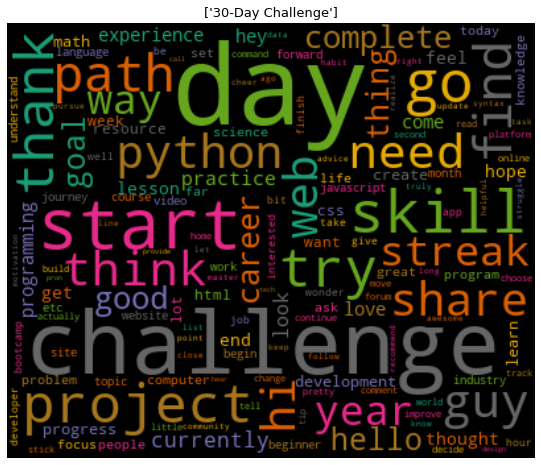

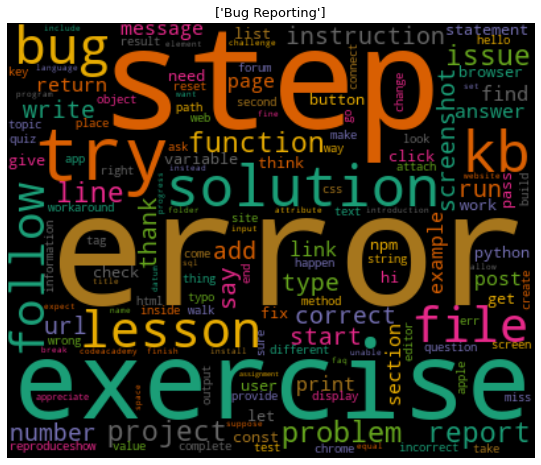

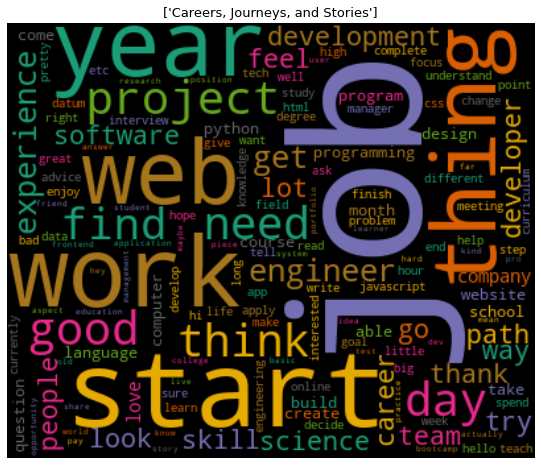

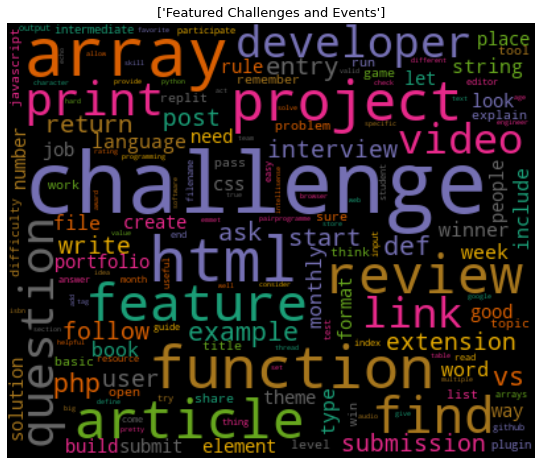

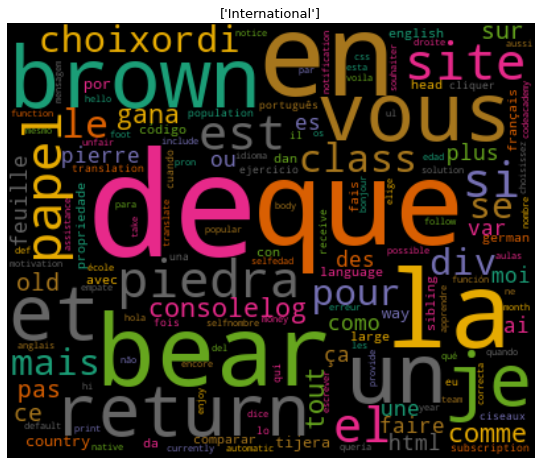

...

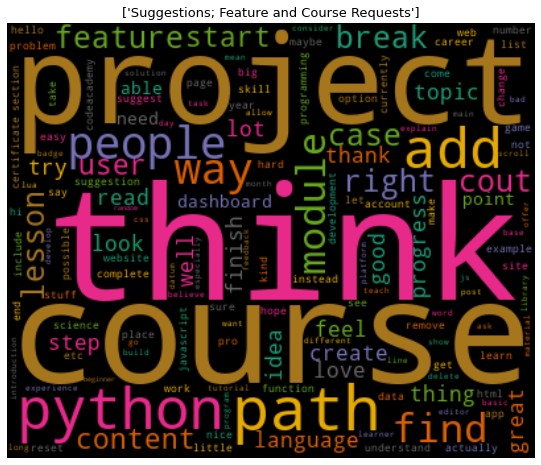

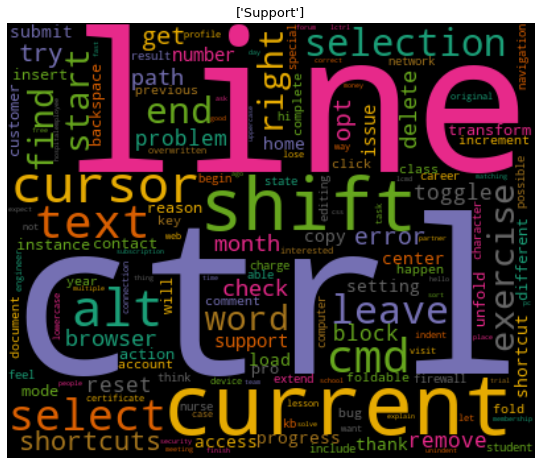

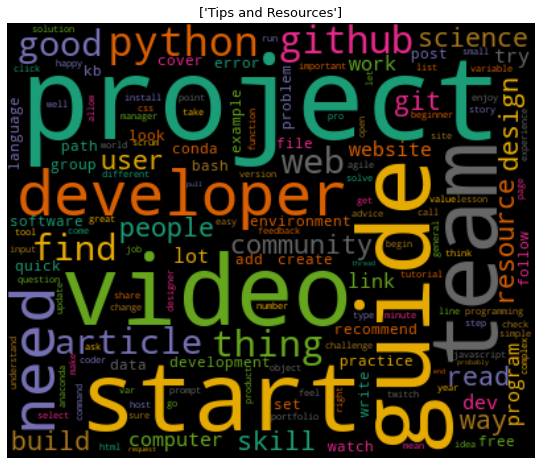

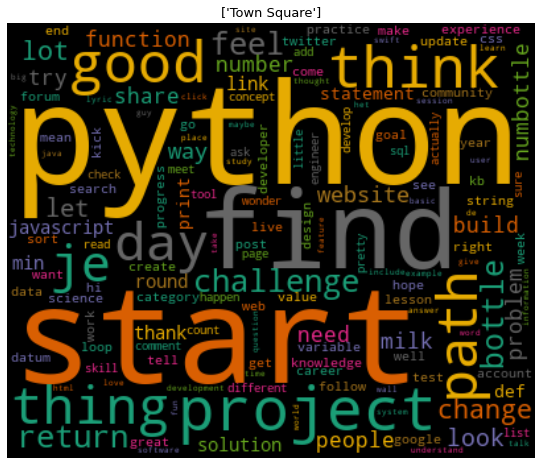

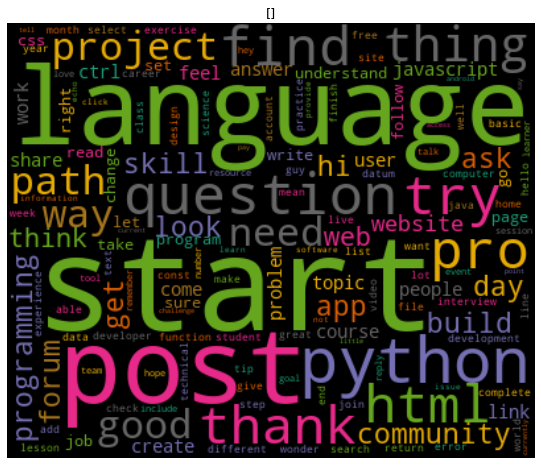

In [27]:
# Importing wordcloud for plotting word clouds and textwrap for wrapping longer text
from wordcloud import WordCloud
from textwrap import wrap

# Function for generating word clouds
def generate_wordcloud(data,title):
    wc = WordCloud(width=400, height=330, max_words=150,colormap="Dark2").generate_from_frequencies(data)
    plt.figure(figsize=(10,8))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.title('\n'.join(wrap(title,60)),fontsize=13)
    plt.show()
  
#  Transposing document term matrix
df_dtm=df_dtm.transpose()

# Plotting word cloud for each category
for index,tags in enumerate(df_dtm.columns):
    generate_wordcloud(df_dtm[tags].sort_values(ascending=False),tags)

In [43]:
#Lowercase the reviews
df['cleaned_other']=df['Other Comments'].apply(lambda x: x.lower())
#Remove digits and words containing digits
df['cleaned_other']=df['cleaned_other'].apply(lambda x: re.sub('\w*\d\w*','', x))
#Remove Punctuations
df['cleaned_other']=df['cleaned_other'].apply(lambda x: re.sub('[%s]' % re.escape(string.punctuation), '', x))
# Removing extra spaces
df['cleaned_other']=df['cleaned_other'].apply(lambda x: re.sub(' +',' ',x))
# Removing new lines
df['cleaned_other']=df['cleaned_other'].apply(lambda x: re.sub('\n',' ',x))

for index,text in enumerate(df['cleaned_other'][0:]):
    print('\n\n Other Comments of Post %d:\n '%(index+1),text)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



hi everyoneni have been into coding for a relative short span of time yet and probably the answer to the question i am about to ask will come over time anyway in order to boost my enthusiasm i thought it would be a good move to ask to the eldersni started to learn coding out of curiosity i thought that it could be useful to approach at least the basics of such widespread tool the web is a huge source of tutorials and tips to learn how to create very engaging projects through coding i am now learning the basics of frontend web developing and on the way i am also taking a look to ui and ue i came across some interesting tutorials that beside teaching the conventional ways of coding text editing they are also teaching how to create user interfaces for mobile devices with softwares that automatically generate code out of design draftsnmy question is if coding can now be easily substituted with software such as supernova studio skipping the whole process of writing down the code manually wh

In [44]:
# Importing spacy
import spacy

# Loading model
nlp = spacy.load('en_core_web_sm',disable=['parser', 'ner'])

# Lemmatization with stopwords removal
df['lemmatized_other']=df['cleaned_other'].apply(lambda x: ' '.join([token.lemma_ for token in list(nlp(x)) if (token.is_stop==False)]))

In [45]:
df_grouped_other=df[['Tags','lemmatized_other']].groupby(by='Tags').agg(lambda x:' '.join(x))
df_grouped_other

,lemmatized_other
Tags,
['30-Day Challenge'],success know want achieve share goal codecadem...
['Bug Reporting'],adminni’m sure right place post thread find ti...
"['Careers, Journeys, and Stories']",guy think start html css course end web develo...
['Featured Challenges and Events'],learn class article david carr develop applica...
['International'],quería preguntar si vale la pena pagar por la ...
['Learn From Home Club'],moment introduce community nbelow question sta...
['Off Topic'],welcome weekly poll nsocial medium advantage...
['Suggestions; Feature and Course Requests'],huge fan wonder tutorial angular come sure lo...
['Support'],have issue get contact customer support start ...


In [46]:
# Creating Document Term Matrix
from sklearn.feature_extraction.text import CountVectorizer
cv_other=CountVectorizer(analyzer='word')
data_other=cv_other.fit_transform(df_grouped_other['lemmatized_other'])
df_dtm_other = pd.DataFrame(data_other.toarray(), columns=cv_other.get_feature_names())
df_dtm_other.index=df_grouped_other.index
df_dtm_other

,aaa,aan,aananchor,aanjulnwe,aappendxn,aarde,aas,ab,abandon,abba,...,הי,مرحبا,अभ,दन,नमस,ようこそ,ハワイ,您好,拝啓,환영합니다
Tags,,,,,,,,,,,,,,,,,,,,,
['30-Day Challenge'],0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
['Bug Reporting'],0,0,0,0,0,0,0,0,2,0,...,0,0,0,0,0,0,0,0,0,0
"['Careers, Journeys, and Stories']",3,0,0,0,0,0,8,0,4,0,...,1,1,1,1,1,1,1,1,1,1
['Featured Challenges and Events'],0,0,0,0,14,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
['International'],0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
['Learn From Home Club'],7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
['Off Topic'],0,0,0,0,0,0,0,17,4,0,...,0,0,0,0,0,0,0,0,0,0
['Suggestions; Feature and Course Requests'],0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
['Support'],0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


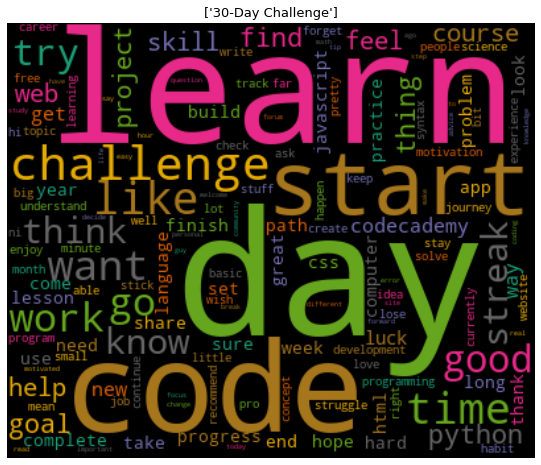

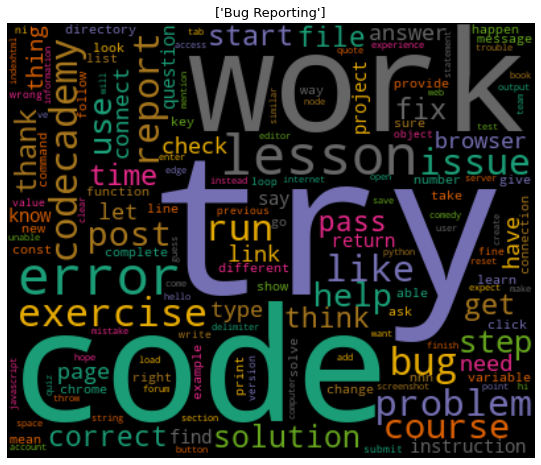

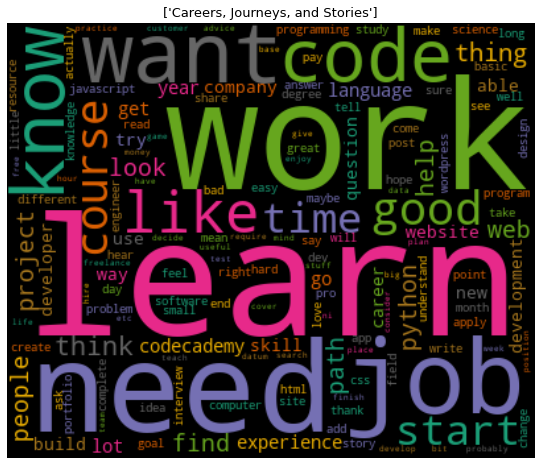

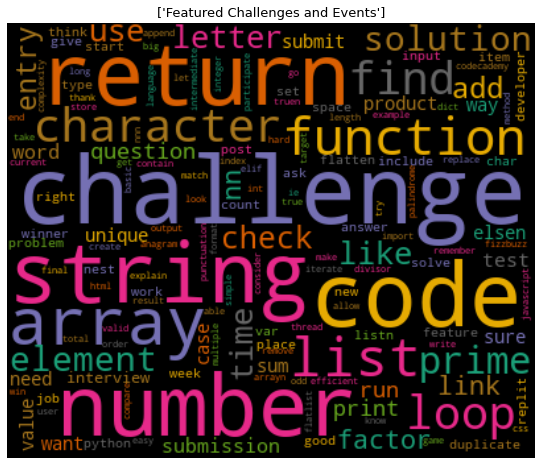

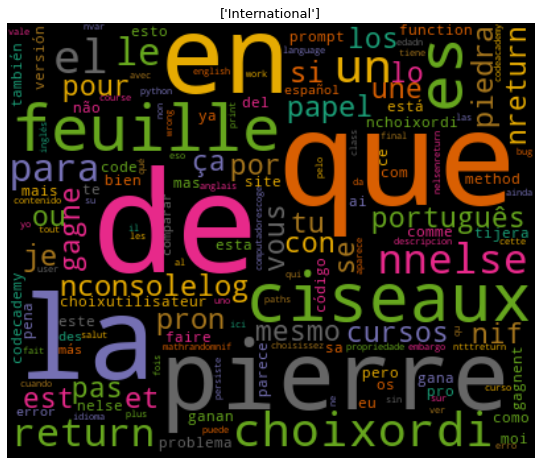

...

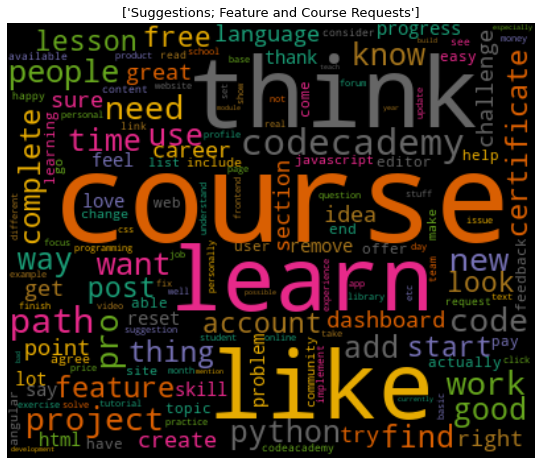

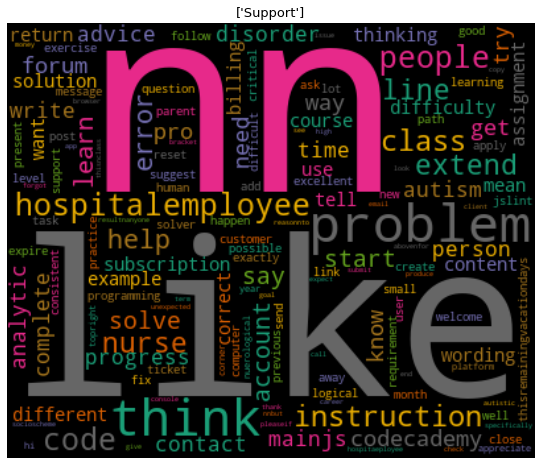

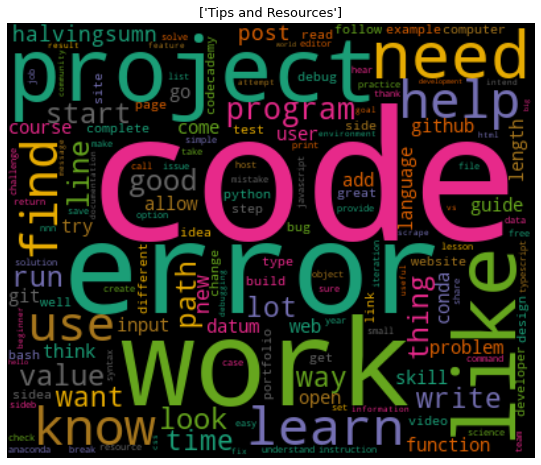

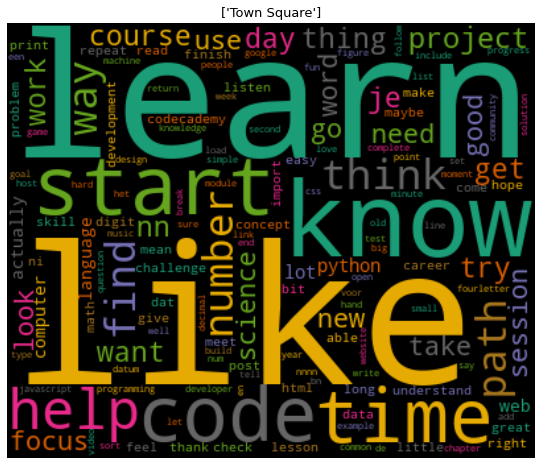

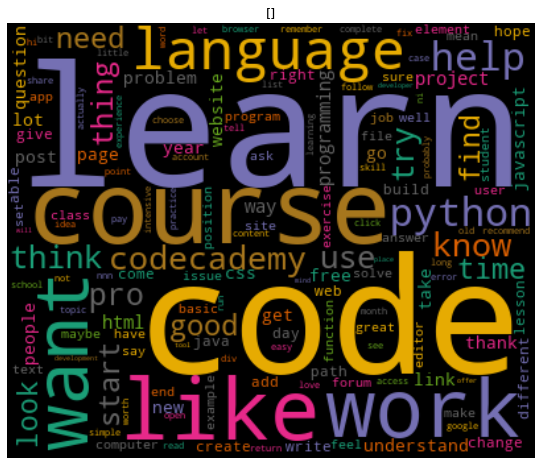

In [47]:
# Importing wordcloud for plotting word clouds and textwrap for wrapping longer text
from wordcloud import WordCloud
from textwrap import wrap

# Function for generating word clouds
def generate_wordcloud(data_other,title):
    wc_other = WordCloud(width=400, height=330, max_words=150,colormap="Dark2").generate_from_frequencies(data_other)
    plt.figure(figsize=(10,8))
    plt.imshow(wc_other, interpolation='bilinear')
    plt.axis("off")
    plt.title('\n'.join(wrap(title,60)),fontsize=13)
    plt.show()
  
#  Transposing document term matrix
df_dtm_other=df_dtm_other.transpose()

# Plotting word cloud for each category
for index,tags in enumerate(df_dtm_other.columns):
    generate_wordcloud(df_dtm_other[tags].sort_values(ascending=False),tags)

In [48]:
# checking only the polarity
from textblob import TextBlob
df['polarity']=df['lemmatized_other'].apply(lambda x:TextBlob(x).sentiment.polarity)

In [50]:
print("3 Random other comments with Highest Polarity:")
for index,other_comment in enumerate(df.iloc[df['polarity'].sort_values(ascending=False)[:3].index]['Other Comments']):
    print('\n\n\n Other Comment {}: '.format(index+1),other_comment)

3 Random other comments with Highest Polarity:



 Other Comment 1:  ['Hey There!\nMy name is Izzy, and I am almost 15. I have taken several courses in JavaScript, HTML, and CSS. I started on Khan Academy, and this is one of my very first programs.\nhttps://www.khanacademy.org/computer-programming/spin-off-of-project-shooting-star/6404198832963584 24\nCheers,\nBella\n “Butterflies can’t see their wings. They can’t see how truly beautiful they are, but everyone else can. People are like that as well.”Hi @dj_bella00! Thanks for stopping by to share your experience.   Keep us updated on how your work evolves!']



 Other Comment 2:  ['learn html5 and css3Welcome to the Forums!\nGood luck & happy coding! ']



 Other Comment 3:  ['I have a problem with the browser panel.\nIt shows this message " ac0af5e92c0e44789219c585f12848ea.cc-propeller.cloud’s server IP address could not be found. "\nwhat should I do?\n\nimage.jpg1920×844 171 KB\nHello @yasser.eltaher, and welcome to Codecademy!\nSee 

In [51]:
print("3 Random other comments with Lowest Polarity:")
for index,other_comment in enumerate(df.iloc[df['polarity'].sort_values(ascending=True)[:3].index]['Other Comments']):
    print('\n\n\n Other Comment {}: '.format(index+1),other_comment)

3 Random other comments with Lowest Polarity:



 Other Comment 1:  ['Hi Guys,\nCan I skip an H3 if my page template does not require it, i.e I have htags for my body text within the template, then my footer is hard coded with headers 4-6. If my page does not need an H3 tag, but my page has the 4-6 hard coded. Is that bad SEO practice?\nThanks for your help!\nKayhave a look at these links.all about heading \nhttp://www.seoblog.com/2014/09/proper-way-use-header-tag-seo/ 1\nand\nhttp://stackoverflow.com/questions/8778829/is-it-ok-to-skip-heading-levels 1\nshort answer: no, you shouldn’t.use css instead.', 'Hi Guys,\nCan I skip an H3 if my page template does not require it, i.e I have htags for my body text within the template, then my footer is hard coded with headers 4-6. If my page does not need an H3 tag, but my page has the 4-6 hard coded. Is that bad SEO practice?\nThanks for your help!\nKayhave a look at these links.all about heading \nhttp://www.seoblog.com/2014/09/proper-way-use-

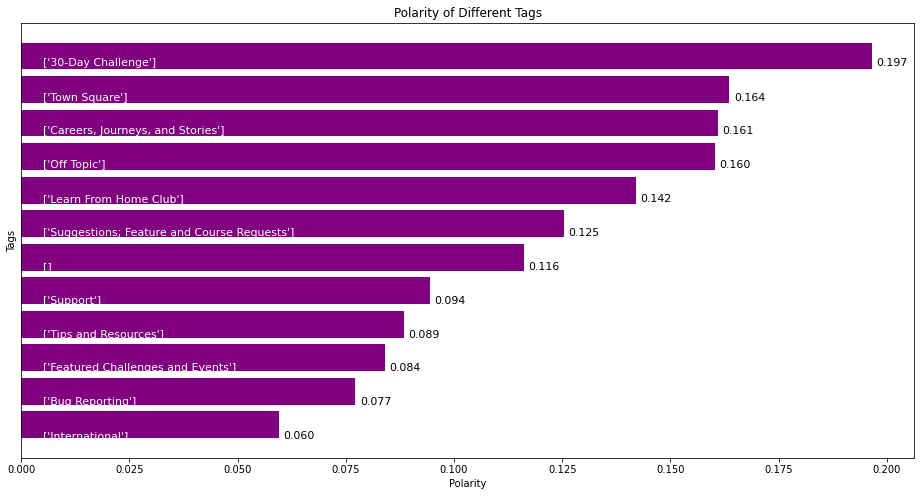

In [52]:
tags_polarity_sorted=pd.DataFrame(df.groupby('Tags')['polarity'].mean().sort_values(ascending=True))

plt.figure(figsize=(16,8))
plt.xlabel('Polarity')
plt.ylabel('Tags')
plt.title('Polarity of Different Tags')
polarity_graph=plt.barh(np.arange(len(tags_polarity_sorted.index)),tags_polarity_sorted['polarity'],color='purple',)

# Writing product names on bar
for bar,tags in zip(polarity_graph,tags_polarity_sorted.index):
    plt.text(0.005,bar.get_y()+bar.get_width(),'{}'.format(tags),va='center',fontsize=11,color='white')

# Writing polarity values on graph
for bar,polarity in zip(polarity_graph,tags_polarity_sorted['polarity']):
    plt.text(bar.get_width()+0.001,bar.get_y()+bar.get_width(),'%.3f'%polarity,va='center',fontsize=11,color='black')
  
plt.yticks([])
plt.show()